<a href="https://colab.research.google.com/github/ArindamKumar/GoogleColab_ML/blob/main/Linear_Regression_Weather_in_Szeged.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Weather in Szeged

Installing `opendatasets` package in order install the kaggle dataset.

In [217]:
!pip install opendatasets --upgrade --quiet
import opendatasets as od
od.version()

'0.1.22'

In [218]:
dataset_url='https://www.kaggle.com/datasets/budincsevity/szeged-weather'

In [219]:
od.download(dataset_url)

Skipping, found downloaded files in "./szeged-weather" (use force=True to force download)


In [220]:
import os

In [221]:
data_dir='./szeged-weather'

In [222]:
os.listdir(data_dir)

['weatherHistory.csv']

In [223]:
train_csv=data_dir+'/weatherHistory.csv'

In [224]:
!pip install pandas --quiet
import pandas as pd

In [225]:
raw_df=pd.read_csv(train_csv)

In [226]:
raw_df

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.
...,...,...,...,...,...,...,...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,Partly Cloudy,rain,26.016667,26.016667,0.43,10.9963,31.0,16.1000,0.0,1014.36,Partly cloudy starting in the morning.
96449,2016-09-09 20:00:00.000 +0200,Partly Cloudy,rain,24.583333,24.583333,0.48,10.0947,20.0,15.5526,0.0,1015.16,Partly cloudy starting in the morning.
96450,2016-09-09 21:00:00.000 +0200,Partly Cloudy,rain,22.038889,22.038889,0.56,8.9838,30.0,16.1000,0.0,1015.66,Partly cloudy starting in the morning.
96451,2016-09-09 22:00:00.000 +0200,Partly Cloudy,rain,21.522222,21.522222,0.60,10.5294,20.0,16.1000,0.0,1015.95,Partly cloudy starting in the morning.


In [227]:
type(raw_df['Formatted Date'])

pandas.core.series.Series

In [228]:
raw_df['Formatted Date']=pd.to_datetime(raw_df['Formatted Date'],utc='true')

In [229]:
print(raw_df['Formatted Date'][45])
type(raw_df['Formatted Date'][10])

2006-04-10 19:00:00+00:00


pandas._libs.tslibs.timestamps.Timestamp

In [230]:
raw_df.describe()

,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars)
count,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.0,96453.000000
mean,11.932678,10.855029,0.734899,10.810640,187.509232,10.347325,0.0,1003.235956
std,9.551546,10.696847,0.195473,6.913571,107.383428,4.192123,0.0,116.969906
min,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,4.688889,2.311111,0.600000,5.828200,116.000000,8.339800,0.0,1011.900000
50%,12.000000,12.000000,0.780000,9.965900,180.000000,10.046400,0.0,1016.450000
75%,18.838889,18.838889,0.890000,14.135800,290.000000,14.812000,0.0,1021.090000
max,39.905556,39.344444,1.000000,63.852600,359.000000,16.100000,0.0,1046.380000


In [231]:
raw_df.info()
raw_df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   Formatted Date            96453 non-null  datetime64[ns, UTC]
 1   Summary                   96453 non-null  object             
 2   Precip Type               95936 non-null  object             
 3   Temperature (C)           96453 non-null  float64            
 4   Apparent Temperature (C)  96453 non-null  float64            
 5   Humidity                  96453 non-null  float64            
 6   Wind Speed (km/h)         96453 non-null  float64            
 7   Wind Bearing (degrees)    96453 non-null  float64            
 8   Visibility (km)           96453 non-null  float64            
 9   Loud Cover                96453 non-null  float64            
 10  Pressure (millibars)      96453 non-null  float64            
 11  Daily Summary  

(96453, 12)

##Exploratory Data Analysis

In [232]:
!pip install seaborn plotly matplotlib --quiet

In [233]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

Bar graph of Hour vs. Temperature (C)

Violin plot of Hour vs. Temperature (C)

Violin plot of Hour vs. Humidity

Bar plot of Hour vs. Humidity

Histogram of Humidy vs. Temperature (C) and Apparent Temperature (C)

In [234]:
px.histogram(raw_df,x='Humidity',y=['Temperature (C)','Apparent Temperature (C)'])

His

In [235]:
px.histogram(raw_df, x='Wind Speed (km/h)', y=['Temperature (C)','Apparent Temperature (C)'])

In [236]:
px.histogram(raw_df,x='Humidity',y='Visibility (km)')

In [237]:
px.histogram(raw_df, x='Wind Speed (km/h)', y='Humidity')

In [238]:
px.histogram(raw_df, x='Wind Speed (km/h)', y='Pressure (millibars)')

<Axes: xlabel='Apparent Temperature (C)', ylabel='Summary'>

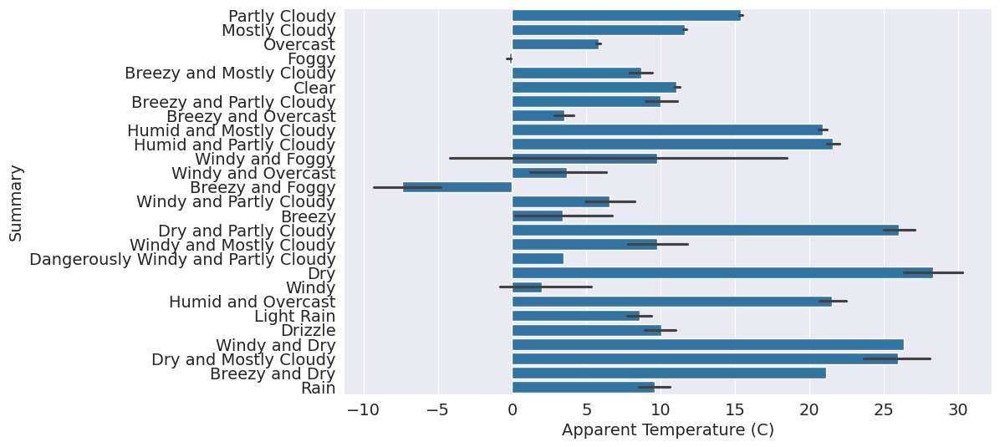

In [239]:
sns.barplot(raw_df, x='Apparent Temperature (C)', y='Summary')

In [240]:
px.scatter(raw_df, x='Humidity', y='Apparent Temperature (C)',color='Summary')

<Axes: xlabel='Wind Speed (km/h)', ylabel='Summary'>

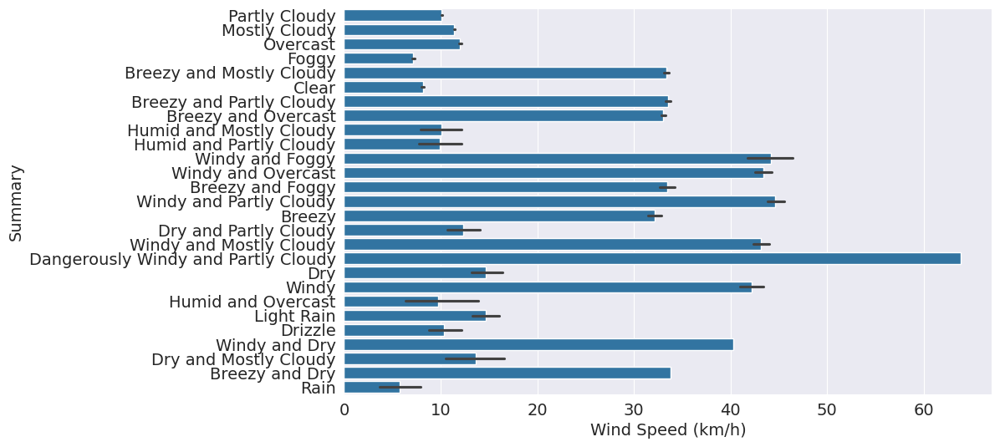

In [241]:
sns.barplot(raw_df, x='Wind Speed (km/h)', y='Summary')

<Axes: xlabel='Humidity', ylabel='Summary'>

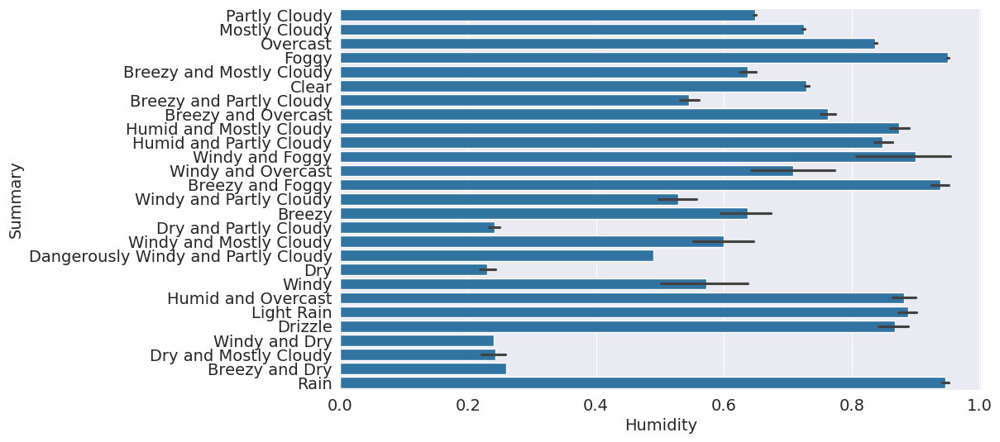

In [242]:
sns.barplot(raw_df, x='Humidity', y='Summary')
# plt.figure(figsize=(15,15))

In [243]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   Formatted Date            96453 non-null  datetime64[ns, UTC]
 1   Summary                   96453 non-null  object             
 2   Precip Type               95936 non-null  object             
 3   Temperature (C)           96453 non-null  float64            
 4   Apparent Temperature (C)  96453 non-null  float64            
 5   Humidity                  96453 non-null  float64            
 6   Wind Speed (km/h)         96453 non-null  float64            
 7   Wind Bearing (degrees)    96453 non-null  float64            
 8   Visibility (km)           96453 non-null  float64            
 9   Loud Cover                96453 non-null  float64            
 10  Pressure (millibars)      96453 non-null  float64            
 11  Daily Summary  

##Data Preprocessing

In [244]:
!pip install numpy --quiet

In [245]:
import numpy as np

In [246]:
raw_df.isna().sum()

,0
Formatted Date,0
Summary,0
Precip Type,517
Temperature (C),0
Apparent Temperature (C),0
Humidity,0
Wind Speed (km/h),0
Wind Bearing (degrees),0
Visibility (km),0
Loud Cover,0


In [247]:
raw_df.nunique()

,0
Formatted Date,96429
Summary,27
Precip Type,2
Temperature (C),7574
Apparent Temperature (C),8984
Humidity,90
Wind Speed (km/h),2484
Wind Bearing (degrees),360
Visibility (km),949
Loud Cover,1


In [248]:
raw_df.columns

Index(['Formatted Date', 'Summary', 'Precip Type', 'Temperature (C)',
       'Apparent Temperature (C)', 'Humidity', 'Wind Speed (km/h)',
       'Wind Bearing (degrees)', 'Visibility (km)', 'Loud Cover',
       'Pressure (millibars)', 'Daily Summary'],
      dtype='object')

In [249]:
input_cols=list(raw_df.columns)[1:4] + list(raw_df.columns)[5:-5]
target_col='Apparent Temperature (C)'

categorical_cols=['Summary','Precip Type']
numerical_cols=list(set(input_cols)-set(categorical_cols))

In [250]:
input_cols

['Summary', 'Precip Type', 'Temperature (C)', 'Humidity', 'Wind Speed (km/h)']

In [251]:
raw_df[categorical_cols]=raw_df[categorical_cols].fillna('Unknown')

In [252]:
raw_df[categorical_cols].isna().sum()

,0
Summary,0
Precip Type,0


In [253]:
# raw_df['Hour']=raw_df['Formatted Date'].dt.hour
# raw_df['Day']=raw_df['Formatted Date'].dt.day
# raw_df['Month']=raw_df['Formatted Date'].dt.month
raw_df['Year']=raw_df['Formatted Date'].dt.year

# raw_df.drop('Hour',axis=1,inplace=True)
# raw_df.drop('Day',axis=1,inplace=True)
# raw_df.drop('Month',axis=1,inplace=True)
# raw_df.drop('Year',axis=1,inplace=True)

In [254]:
train_df=raw_df[raw_df.Year<=2011].copy()
val_df=raw_df[(raw_df.Year>=2012) & (raw_df.Year<=2014)].copy()
test_df=raw_df[raw_df.Year>=2015].copy()

In [255]:
raw_df.drop('Year',axis=1,inplace=True)

In [256]:
train_input=train_df[input_cols].copy()
train_target=train_df[target_col].copy()

val_input=val_df[input_cols].copy()
val_target=val_df[target_col].copy()

test_input=test_df[input_cols].copy()
test_target=test_df[target_col].copy()

####Encoding Categorical Columns

In [257]:
from sklearn.preprocessing import OneHotEncoder

In [258]:
encoder=OneHotEncoder(sparse_output=False,handle_unknown='ignore')
encoder.fit(raw_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [259]:
encoded_cols=list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Summary_Breezy', 'Summary_Breezy and Dry', 'Summary_Breezy and Foggy', 'Summary_Breezy and Mostly Cloudy', 'Summary_Breezy and Overcast', 'Summary_Breezy and Partly Cloudy', 'Summary_Clear', 'Summary_Dangerously Windy and Partly Cloudy', 'Summary_Drizzle', 'Summary_Dry', 'Summary_Dry and Mostly Cloudy', 'Summary_Dry and Partly Cloudy', 'Summary_Foggy', 'Summary_Humid and Mostly Cloudy', 'Summary_Humid and Overcast', 'Summary_Humid and Partly Cloudy', 'Summary_Light Rain', 'Summary_Mostly Cloudy', 'Summary_Overcast', 'Summary_Partly Cloudy', 'Summary_Rain', 'Summary_Windy', 'Summary_Windy and Dry', 'Summary_Windy and Foggy', 'Summary_Windy and Mostly Cloudy', 'Summary_Windy and Overcast', 'Summary_Windy and Partly Cloudy', 'Precip Type_Unknown', 'Precip Type_rain', 'Precip Type_snow']


In [260]:
train_input[encoded_cols]=encoder.transform(train_input[categorical_cols])
val_input[encoded_cols]=encoder.transform(val_input[categorical_cols])
test_input[encoded_cols]=encoder.transform(test_input[categorical_cols])

In [261]:
pd.set_option('display.max_columns',None)

In [262]:
train_input

,Summary,Precip Type,Temperature (C),Humidity,Wind Speed (km/h),Summary_Breezy,Summary_Breezy and Dry,Summary_Breezy and Foggy,Summary_Breezy and Mostly Cloudy,Summary_Breezy and Overcast,Summary_Breezy and Partly Cloudy,Summary_Clear,Summary_Dangerously Windy and Partly Cloudy,Summary_Drizzle,Summary_Dry,Summary_Dry and Mostly Cloudy,Summary_Dry and Partly Cloudy,Summary_Foggy,Summary_Humid and Mostly Cloudy,Summary_Humid and Overcast,Summary_Humid and Partly Cloudy,Summary_Light Rain,Summary_Mostly Cloudy,Summary_Overcast,Summary_Partly Cloudy,Summary_Rain,Summary_Windy,Summary_Windy and Dry,Summary_Windy and Foggy,Summary_Windy and Mostly Cloudy,Summary_Windy and Overcast,Summary_Windy and Partly Cloudy,Precip Type_Unknown,Precip Type_rain,Precip Type_snow
0,Partly Cloudy,rain,9.472222,0.89,14.1197,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,Partly Cloudy,rain,9.355556,0.86,14.2646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,Mostly Cloudy,rain,9.377778,0.89,3.9284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,Partly Cloudy,rain,8.288889,0.83,14.1036,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,Mostly Cloudy,rain,8.755556,0.83,11.0446,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52604,Mostly Cloudy,rain,18.788889,0.62,7.7441,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
52605,Mostly Cloudy,rain,17.644444,0.71,3.3649,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
52606,Partly Cloudy,rain,16.994444,0.73,6.2790,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
52607,Partly Cloudy,rain,15.244444,0.80,6.1663,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [263]:
X_train=train_input[numerical_cols+encoded_cols]
X_val=val_input[numerical_cols+encoded_cols]
X_test=test_input[numerical_cols+encoded_cols]

##Training a Linear Regression Model

In [264]:
from sklearn.linear_model import LinearRegression

In [265]:
model=LinearRegression()

In [266]:
model.fit(X_train,train_target)

LinearRegression()

In [267]:
print(numerical_cols+encoded_cols)

['Temperature (C)', 'Wind Speed (km/h)', 'Humidity', 'Summary_Breezy', 'Summary_Breezy and Dry', 'Summary_Breezy and Foggy', 'Summary_Breezy and Mostly Cloudy', 'Summary_Breezy and Overcast', 'Summary_Breezy and Partly Cloudy', 'Summary_Clear', 'Summary_Dangerously Windy and Partly Cloudy', 'Summary_Drizzle', 'Summary_Dry', 'Summary_Dry and Mostly Cloudy', 'Summary_Dry and Partly Cloudy', 'Summary_Foggy', 'Summary_Humid and Mostly Cloudy', 'Summary_Humid and Overcast', 'Summary_Humid and Partly Cloudy', 'Summary_Light Rain', 'Summary_Mostly Cloudy', 'Summary_Overcast', 'Summary_Partly Cloudy', 'Summary_Rain', 'Summary_Windy', 'Summary_Windy and Dry', 'Summary_Windy and Foggy', 'Summary_Windy and Mostly Cloudy', 'Summary_Windy and Overcast', 'Summary_Windy and Partly Cloudy', 'Precip Type_Unknown', 'Precip Type_rain', 'Precip Type_snow']


In [268]:
model.coef_

array([ 1.11525833e+00, -1.10156247e-01,  7.40470469e-01, -5.20447775e-01,
        7.77156117e-16, -2.13466098e+00,  9.47734734e-01, -9.37445331e-02,
        8.27218697e-01, -3.78269053e-01,  1.63932891e+00,  1.44328993e-15,
       -2.29244331e+00,  5.41016884e-16, -1.42107771e+00, -7.32084665e-02,
       -2.16297692e-01, -8.60971616e-01, -5.06147324e-01, -4.44089210e-16,
       -2.06841221e-01, -3.96341140e-01, -3.36420090e-01,  0.00000000e+00,
        9.75802016e-01,  0.00000000e+00,  7.41313511e-01,  2.39111507e+00,
        5.39091809e-01,  1.37526616e+00,  0.00000000e+00,  1.89976862e-01,
       -1.89976862e-01])

In [269]:
model.intercept_

np.float64(-1.6504063620914504)

##Making Predictions and Evaluating the model

In [270]:
def predict_evaluate(input,target):
    preds=model.predict(input)
    from sklearn.metrics import mean_absolute_error
    return mean_absolute_error(target,preds)

In [271]:
predict_evaluate(X_train,train_target)

0.8498408365101066

Making predictions on the validation and test data and evaluating the errors found in the predictions.

In [272]:
predict_evaluate(X_val,val_target)

0.8423866059420885

In [273]:
predict_evaluate(X_test,test_target)

0.834351643110065

Hence, the model gives predictions with an error of +/- 0.84 degree C on the apparent temperature.

##Testing on new input

In [274]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   Formatted Date            96453 non-null  datetime64[ns, UTC]
 1   Summary                   96453 non-null  object             
 2   Precip Type               96453 non-null  object             
 3   Temperature (C)           96453 non-null  float64            
 4   Apparent Temperature (C)  96453 non-null  float64            
 5   Humidity                  96453 non-null  float64            
 6   Wind Speed (km/h)         96453 non-null  float64            
 7   Wind Bearing (degrees)    96453 non-null  float64            
 8   Visibility (km)           96453 non-null  float64            
 9   Loud Cover                96453 non-null  float64            
 10  Pressure (millibars)      96453 non-null  float64            
 11  Daily Summary  

##Prediction on a Single Input

Extracting the weather data from OpenWeatherMap.org API

In [275]:
!pip install requests --quiet

In [276]:
# import requests
# from datetime import datetime
# import pandas as pd # Import pandas as it is used later in the notebook

# def get_weather_szeged(api_key):
#     # Fetch data from OpenWeatherMap API
#     city = "Szeged,HU"
#     url = f"http://api.openweathermap.org/data/2.5/weather?q={city}&appid={api_key}&units=metric"
#     response = requests.get(url).json()

#     # Print the full response to help debug
#     print("API Response:", response)

#     # Check if the API call was successful
#     if response.get("cod") == 200: # OpenWeatherMap returns 'cod: 200' for success
#         # Extract relevant fields
#         weather_data = {
#             "Formatted Date": datetime.utcfromtimestamp(response["dt"]).strftime('%Y-%m-%d %H:%M:%S'),
#             "Summary": response["weather"][0]["main"],
#             "Precip Type": "rain" if "rain" in response else "snow" if "snow" in response else None, # Simplified check
#             "Temperature (C)": response["main"]["temp"],
#             "Apparent Temperature (C)": response["main"]["feels_like"],
#             "Humidity": response["main"]["humidity"] / 100,  # Convert to 0-1 scale
#             "Wind Speed (km/h)": response["wind"]["speed"] * 3.6,  # Convert m/s to km/h
#             "Wind Bearing (degrees)": response["wind"].get("deg", 0),
#             "Visibility (km)": response.get("visibility", 10000) / 1000,  # Convert meters to km
#             "Loud Cover": 0.0,  # Not provided by OpenWeatherMap
#             "Pressure (millibars)": response["main"]["pressure"],
#             # Daily Summary is not available in the current weather endpoint, remove or provide a placeholder
#             # "Daily Summary": f"{response['weather'][0]['description'].capitalize()} throughout the day."
#         }
#         return weather_data
#     else:
#         # Handle the API error
#         print(f"Error fetching weather data: {response.get('message', 'Unknown error')}")
#         return None # Return None to indicate failure

# # Replace 'YOUR_API_KEY' with your actual OpenWeatherMap API key
# api_key = "0488dbe29a1deb76fa642b40bf628616"
# weather_szeged = get_weather_szeged(api_key)

# # Print the result
# print("Weather data for Szeged:", weather_szeged)

In [277]:
def singleInputPredict(input):
  input_df=pd.DataFrame([input])
  input_df[encoded_cols]=encoder.transform(input_df[categorical_cols])
  X_input=input_df[numerical_cols+encoded_cols]
  return model.predict(X_input)

In [278]:
input={
    'Formatted Date': '2023-11-15 14:30:00',
    'Summary': 'Clouds',
    'Precip Type': None,
    'Temperature (C)': 12.5,
    'Apparent Temperature (C)': 10.2,
    'Humidity': 0.87,
    'Wind Speed (km/h)': 14.4,
    'Wind Bearing (degrees)': 210,
    'Visibility (km)': 10.0,
    'Loud Cover': 0.0,
    'Pressure (millibars)': 1012,
    'Daily Summary': 'Broken clouds throughout the day.'
}

print("Predicted Apparent Temperature (C): ",singleInputPredict(input)[0])

Predicted Apparent Temperature (C):  11.348282108550487
